In [1]:
import numpy as np
import matplotlib.pyplot as plt

# This library is used to read and show the images and plots, to install it use `pip install matplotlib`
import matplotlib.animation

Matplotlib is building the font cache; this may take a moment.


# Q1 - Histograms and Distributions
Are these code chunks equivalent?
```python
np.random.randint(0, 11, (3, 3))
```
And
```python
arr = np.random.normal(0, 1, (3, 3))
arr = (arr - arr.min()) / (arr.max() - arr.min()) * 10
arr.astype(int)
```
As we could see in the course, the distribution of the first code chunk is uniform, while the second one is normal. To see this we can plot the [histogram](https://en.wikipedia.org/wiki/Histogram) of the values generated by each code chunk. One of the most important concepts in histogram is the **bin**. A bin is a range of values that is used to count how many values fall in that range. The number of bins is a parameter that can be set by the user. 
> The more bins we have, the more detailed the histogram will be.

To understand more about bins, let's complete the following function:

## What are the bins?

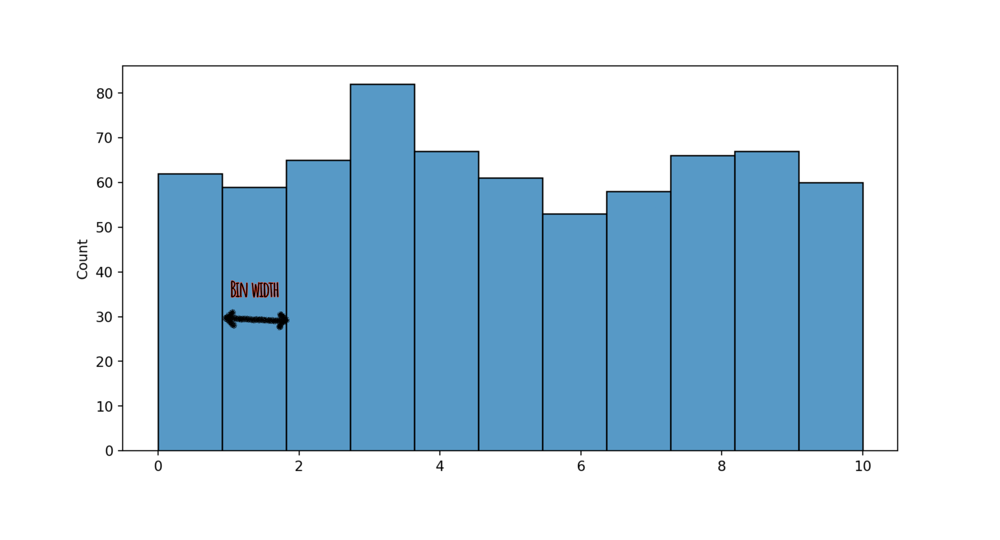

In the following function, we will calculate the bin width given:
1. The number of bins
2. the data itself

> Tip: We need to fit the bins in the range of the data. So, the number of bins multiplied by the bin width should be equal to the range of the data.

In [10]:
def find_bin_width(bin_count: int, data: np.ndarray) -> float:
    """
    Find the width of the bins for a histogram with a given number of bins.
    """
    if data.ndim != 1:
        data = data.flatten()  # Make the data 1D if needed
    data_range = data.max() - data.min()
    bin_width = data_range / bin_count
    return bin_width


> Note: for the type annotations, we used `np.ndarray` to indicate that the function should receive a numpy array as input.

We can make sure that the function is correct by using `np.histogram` function:

In [11]:
# Test cell
# Test cell
assert np.isclose(find_bin_width(10, np.array([1, 2, 3, 4, 5])), 0.4)
assert np.isclose(find_bin_width(20, np.array([1, 2, 3, 4, 5])), 0.2)
assert np.isclose(find_bin_width(10, np.array([1, 2, 3, 4, 5, 6])), 0.5)

for _ in range(20):
    data = np.random.normal(0, 1, 100)
    bin_count = np.random.randint(1, 100)
    freq, bins = np.histogram(data, bins=bin_count)
    assert np.allclose(
        (cbw := find_bin_width(bin_count, data)), (bw := bins[1] - bins[0])
    ), f"The correct bin width is {bw} but got {cbw}"

In [10]:
data = np.array([1, 1.9, 1.4, 1, 2.7, 2, 3, 4.8, 4, 5, 5, 5, 5])
freq, bins = np.histogram(data, bins=4)
print(f"The freqencies are {freq}")
print(f"The bins border are {bins}")

The freqencies are [4 2 1 6]
,The bins border are [1. 2. 3. 4. 5.]


According to the documentation, the function returns two values:
- The first one is an array with the number of values in each bin (i.e., the high of the bars in the histogram).
- The second one is an array with the edges of the bins. 

> Note: The number of bins is equal to the length of the array with the edges minus one. (in previous example, we had `len(bins) - 1 == len(freq)`)



for instance, in the previous example: `freq[0]` is 4 and `bins[0:2]` is `[1, 2]`. This means that there are 4 values in the range $[1, 2)$.

### Notes
> 1. When we use `_` as a variable name, we are not going to use it. It's value is not important and it's used to avoid the syntax error.

> 2. The function `np.allclose(a,b)` returns `True` if the arrays `a` and `b` are equal within some small tolerance $|a-b| < 10^{-8} + 10^{-5} \times |b|$.

> 3. The name of variables `bw` and `cbw` are not very descriptive. Since we are not going to use them again, it ok to use abbreviations. But in general, it's better to use more descriptive names. For instace, `bw` could be `bin_width` and `cbw` could be `calculated_bin_width`.

## Drawing the histogram

### The hard way

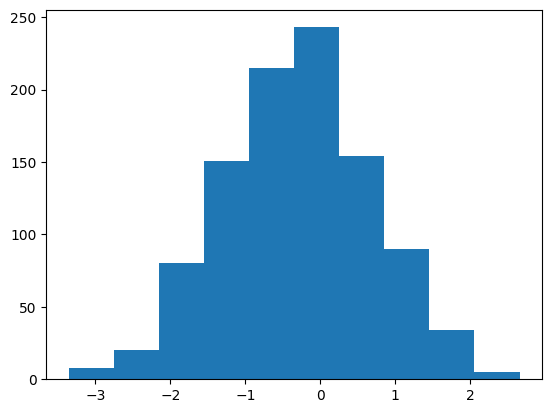

In [6]:
data = np.random.normal(0, 1, 1000)
bin_count = 10
freq, bins = np.histogram(data, bins=bin_count)
bin_width = bins[1] - bins[0]
plt.bar(bins[:-1], freq, width=bin_width)
plt.show()

### Notes
> 1. As we know, the `bins` array has one more element than the `freq` array. This is because the `bins` array has the edges of the bins, while the `freq` array has the number of values in each bin.

> 2. Normally, we don't use this approach to draw histograms unless we want to customize the plot or the histogram.

### The easy way

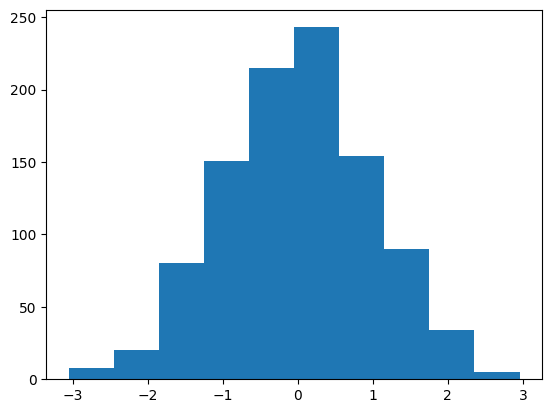

In [7]:
plt.hist(data, bins=bin_count)
plt.show()

Now lets go back to the original question: Are these code chunks equivalent?

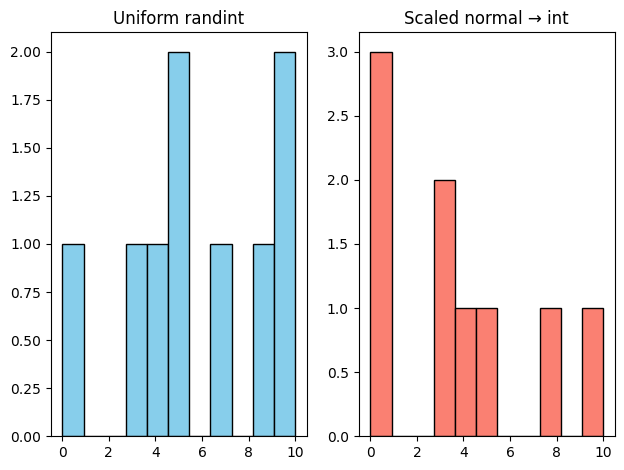

In [12]:
data1 = np.random.randint(0, 11, (3, 3))

data2 = np.random.normal(0, 1, (3, 3))
# ✏️ map the data2 to range 0 to 10 (similar to data1) (1 point)
# ✏️ convert the data2 to integer (1 point)


data2 = np.random.normal(0, 1, (3, 3))
data2 = (data2 - data2.min()) / (data2.max() - data2.min()) * 10  # Now in [0, 10]
data2 = data2.astype(int)  # Convert to integer


#plt.subplot(1, 2, 1)
# ✏️ plot the histogram of data1 with 11 bins (1 point)
#plt.subplot(1, 2, 2)
# ✏️ plot the histogram of data2 with 11 bins (1 point)

data1 = np.random.randint(0, 11, (3, 3))
data2 = np.random.normal(0, 1, (3, 3))
data2 = (data2 - data2.min()) / (data2.max() - data2.min()) * 10
data2 = data2.astype(int)

plt.subplot(1, 2, 1)
plt.hist(data1.flatten(), bins=11, color='skyblue', edgecolor='black')
plt.title("Uniform randint")

plt.subplot(1, 2, 2)
plt.hist(data2.flatten(), bins=11, color='salmon', edgecolor='black')
plt.title("Scaled normal → int")



plt.tight_layout()

plt.show()


# Q2 - Digit Spliter

We have an image containing three digits of [MNIST](https://en.wikipedia.org/wiki/MNIST_database) dataset. We want to split the image into three digits.


In [6]:
# to read the image we can use the following code

img = plt.imread("mnist_578.jpg")
print(
    f"shape: {img.shape}, dtype: {img.dtype}, min: {img.min()}, max: {img.max()}, ndim: {img.ndim}"
)

shape: (557, 1439, 3), dtype: uint8, min: 0, max: 255, ndim: 3


✏️ Describe what is the meaning of the `uint8` and why an image should be in this format. (2 points)
uint8 stands for “unsigned 8-bit integer” data type Values range from 0 to 255, where:

0 is the darkest possible pixel (black)

255 is the brightest possible pixel (white).​

Each pixel in a uint8 image stores its intensity or color value as a whole number between 0 and 255.

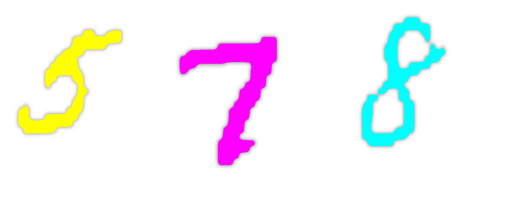

In [7]:
# to plot the image we can use the following code

plt.imshow(img)
plt.axis("off")
plt.show()

## Describing the problem

We want to find the boundry of the images. The idea is to find the white space between the digits (The white space is the region where the pixel values are equal to 255).

> We assume the image has no noise, otherwise we should use some image processing techniques to remove the noise.



As the *first step* we are going to find the sum of the pixels in each column. The result should have three peaks in.

In [13]:
def find_column_sum(img: np.ndarray) -> np.ndarray:
    """
    Find the sum of each column of the image (summing over all rows, and if a color image, all color channels).

    Parameters
    ----------
    img : np.ndarray
        The image to be processed.

    Returns
    -------
    np.ndarray
        The sum of each column of the image.
    """
    # If 3D (color image), sum over rows AND color channels
    if img.ndim == 3:
        return img.sum(axis=(0, 2))
    # If 2D (grayscale), sum over rows
    elif img.ndim == 2:
        return img.sum(axis=0)
    else:
        raise ValueError("Input must be a 2D or 3D numpy array.")

    return np.zeros(img.shape[1])

    


In [14]:
# Test cell
assert all(find_column_sum(np.array([[1, 2], [3, 4]])) == np.array([4, 6]))
assert all(find_column_sum(np.array([[1, 2], [3, 4], [5, 6]])) == np.array([9, 12]))
assert (cs := find_column_sum(img)).shape == (
    img.shape[1],
), f"Expected shape ({img.shape[1]},) but got {cs.shape}"


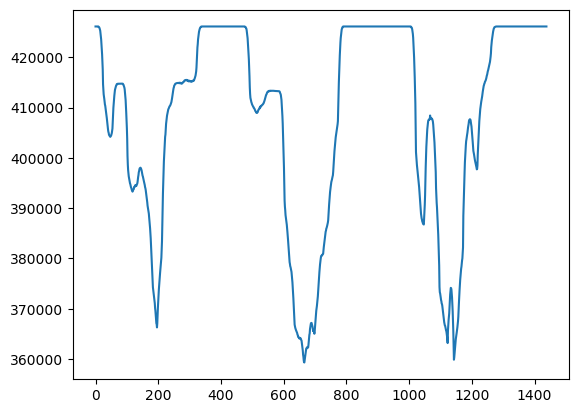

In [15]:
# Let's plot the sum of each column
column_sum = find_column_sum(img)
plt.plot(column_sum)
plt.show()

### Doing some cool visualization
In this part, we want to overlap the image with the histogram of the sum of the pixels in each column. We have two main challenges:

1. The images origin (the point (0,0)) is in the top-left corner, while the origin of the histogram is in the bottom-left corner.
2. The output's range is about 360000 to 420000, while the image's height is 557 pixels.

So we need to normalize the output to fit the image's height.

In [16]:
def normalizer(arr: np.ndarray, reverse=True, max_val=1) -> np.ndarray:
    """
    Normalize the array so that the values are between 0 and `max_val`.

    Parameters
    ----------
    arr : np.ndarray
        The histogram array to be normalized. (it should be a 1D array)
    reverse : bool
        If True, the normalization is reversed. (default is True) (flipping the histogram)
        note: its not like arr[::-1]. for instance, reverse of [1, 2, 5] is [4, 3, 0]
    max_val : int
        The maximum value of the normalized array. (default is 1) (we will use image height)

    Returns
    -------
    np.ndarray
        The normalized array.
    """
    if arr.ndim != 1:
        raise ValueError("The input array should be 1D.")
    arr = arr.astype(float)
    # Min-max normalize to [0, max_val]
    norm = (arr - arr.min()) / (arr.max() - arr.min()) * max_val if arr.max() != arr.min() else np.zeros_like(arr)
    if reverse:
        # Invert: max value becomes 0, min becomes max_val
        norm = max_val - norm
    return norm
    return arr.copy()

In [17]:
testcases = [
    [np.array([1, 2, 3, 4, 5]), True],
    [np.array([1, 2, 3, 4, 5]), False],
    [np.array([1, 2, 3, 3, 3]), True],
    [np.array([9, 9, 0, 7, 6, 5, 6, 6, 2, 1]), False, 4],
    [np.array([7, 4, 8, 2, 9, 10, 7, 8, 1, 8]), False, 7],
    [np.array([6, 10, 9, 6, 3, 1, 8, 0, 7, 5]), False, 2],
    [np.array([0, 9, 0, 10, 9, 6, 5, 8, 6, 9]), False, 4],
]

answers = [
    [1.0, 0.75, 0.5, 0.25, 0.0],
    [0, 0.25, 0.5, 0.75, 1],
    [1.0, 0.5, 0.0, 0.0, 0.0],
    [
        4.0,
        4.0,
        0.0,
        3.111111111111111,
        2.6666666666666665,
        2.2222222222222223,
        2.6666666666666665,
        2.6666666666666665,
        0.8888888888888888,
        0.4444444444444444,
    ],
    [
        4.666666666666666,
        2.333333333333333,
        5.444444444444445,
        0.7777777777777777,
        6.222222222222221,
        7.0,
        4.666666666666666,
        5.444444444444445,
        0.0,
        5.444444444444445,
    ],
    [1.2, 2.0, 1.8, 1.2, 0.6, 0.2, 1.6, 0.0, 1.4, 1.0],
    [0.0, 3.6, 0.0, 4.0, 3.6, 2.4, 2.0, 3.2, 2.4, 3.6],
]


for i, (inputs, answer) in enumerate(zip(testcases, answers)):
    assert np.allclose(
        (ans := normalizer(*inputs)), answer
    ), f"Test case {i+1} failed, expected {answer} but got {ans}"
else:
    print("All testcases passed")


All testcases passed


0.0 557.0


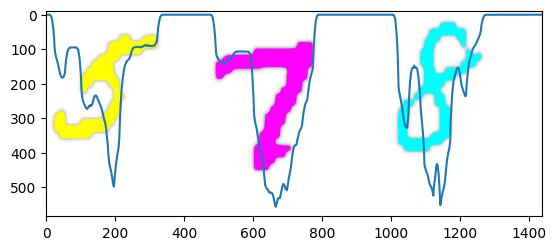

In [39]:
# we can do more cool stuff 🤩
plt.imshow(img)
column_sum_norm = normalizer(column_sum, reverse=True, max_val=img.shape[0])
plt.plot(column_sum_norm)
print(column_sum_norm.min(), column_sum_norm.max())
plt.ylim(plt.ylim()[0], -10)
plt.show()

We can see the picks are perfectly matched with the digits borders.


## Converting the peaks to the hills

Working with the picks is a bit harder, let's inverse the image and find the valleys in the histogram of the sum of the pixels in each column.

To do so, we will convert the white pixels (the intensity is 255) to black pixels and vice versa. Then we will 

In [19]:
def image_inverter(img: np.ndarray) -> np.ndarray:
    """
    Invert the image colors.

    Parameters
    ----------
    img : np.ndarray
        The image to be inverted.

    Returns
    -------
    np.ndarray
        The inverted image.
    """
    # ✏️ find the color inversion of the image (1 point)
    return 255 - img
    return img.copy()

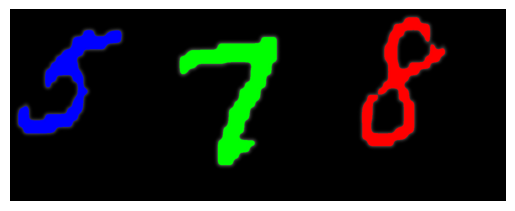

In [20]:
img_inv = image_inverter(img)
plt.imshow(img_inv)
plt.axis("off")
plt.show()

Now we can repeat the same process:

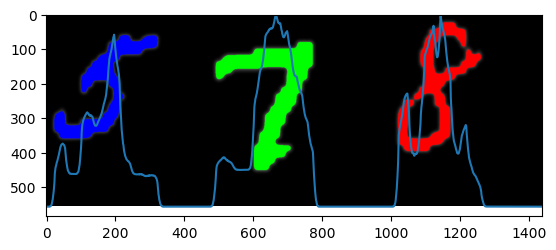

In [21]:
column_sum_inv = find_column_sum(img_inv)
plt.imshow(img_inv)
column_sum_inv_norm = normalizer(column_sum_inv, reverse=True, max_val=img.shape[0])
plt.plot(column_sum_inv_norm)
plt.show()

# We can see the importance of functional programing here, we wanted to make a very small change to our pipline and we did it in a very short time. 🚀
# But if we didn't use functions, we would have to copy and paste the code and make the changes manually. 😢

## Finding the digits

now we can find the digits by finding the zeros in the sequential zeros in the valleys. (3 points)

In [26]:
def find_valeys_border(arr: np.ndarray) -> np.ndarray:
    """
    Find the borders of the valleys in the array.
    In the other words, find the index of sequence of zeros.
    For instance, for the array [1, 2, 0, 0, 0, 3, 4, 0, 0, 0, 0, 5, 6], the output should be [[2, 5], [7, 11]].

    Parameters
    ----------
    arr : np.ndarray
        The input array. (1D array)

    Returns
    -------
    np.ndarray
        The borders of the valleys. (2D array)
        Two columns, the start and end of the valley.

    """
    if arr.ndim != 1:
        raise ValueError("The input array should be 1D.")
    # ✏️ find the borders of the valleys (3 points)
    # ✏️🤑 don't use loops (4 Bonus points)
    # Create indicator for zero
    iszero = np.concatenate(([0], (arr == 0).astype(int), [0]))
    # Change points (edges of valleys)
    edges = np.where(np.diff(iszero) != 0)[0]
    # Pair up starts and ends
    borders = np.stack([edges[::2], edges[1::2]], axis=1)
    return borders

    return np.random.randint(0, 10, (4, 2))

In [27]:
testcases = [
    np.array([1, 1, 3, 2, 7, 0, 0, 0, 4, 5, 0, 0, 0, 0, 0, 6, 7]),
    np.array([1, 2, 3, 4, 5, 0, 0, 0, 6, 7, 8, 9, 10]),
    np.array([0, 0, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]),
    np.array([1, 2, 0, 0, 0, 3, 4, 0, 0, 0, 0, 5, 6, 0]),
    np.array([0, 3, 4, 0, 0, 0, 0, 5, 6, 0, 0, 0, 0, 0, 7, 8, 9, 0]),
]

answers = [
    np.array([[5, 8], [10, 15]]),
    np.array([[5, 8]]),
    np.array([[0, 3]]),
    np.array([[2, 5], [7, 11], [13, 14]]),
    np.array([[0, 1], [3, 7], [9, 14], [17, 18]]),
]


for i, (inputs, answer) in enumerate(zip(testcases, answers)):
    assert (ans := find_valeys_border(inputs)).shape == answer.shape and np.all(
        ans == answer
    ), f"Test case {i+1} failed, expected {answer} but got {ans}"
else:
    print("All testcases passed")

All testcases passed


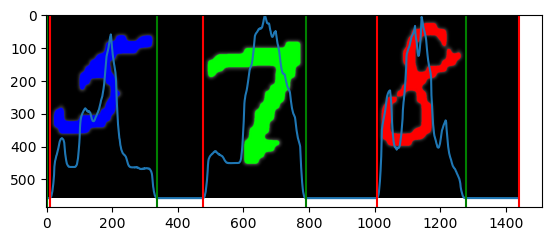

In [28]:
from cProfile import label


column_sum_inv = find_column_sum(img_inv)
plt.imshow(img_inv)
column_sum_inv_norm = normalizer(column_sum_inv, reverse=True, max_val=img.shape[0])
plt.plot(column_sum_inv_norm)
valleys = find_valeys_border(column_sum_inv)
for start, end in valleys:
    plt.axvline(start, color="green")
    plt.axvline(end, color="red")

plt.show()


# Q3 - Combining the images
## The problem
We have two images ($I_1, I_2$) and we want to combine them together. We can consiedr each image as a matrix (2D or 3D does not matter here, for simplicity we can consider them as 2D matrices). We can combine them using the following formula:

$$
I = \frac{I_1 + I_2}{2}
$$

or
$$
I = \frac{I_1}{2} + \frac{I_2}{2}
$$

Are they same? let's find out.

<small> spoiler alert: they are not the same </small>

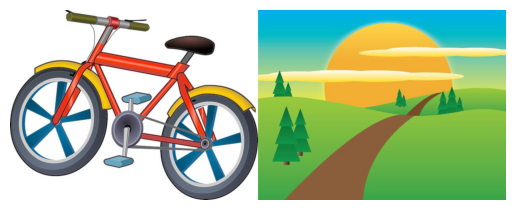

In [30]:
img1 = plt.imread("lorem1.jpg")
img2 = plt.imread("lorem2.jpg")
plt.imshow(np.concatenate([img1, img2], axis=1))
plt.axis("off")
plt.show()

let's try $\frac{I_1 + I_2}{2}$ first.

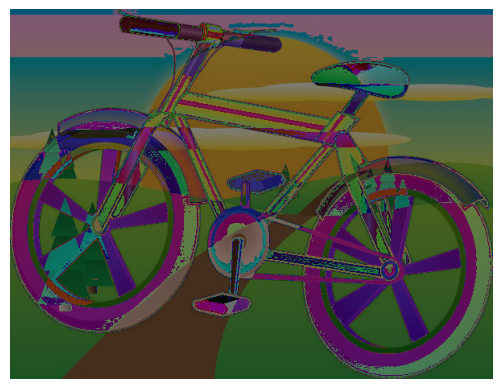

In [31]:
plt.imshow((img1 + img2) // 2)
plt.axis("off")
plt.show()

Now let's try $\frac{I_1}{2} + \frac{I_2}{2}$.

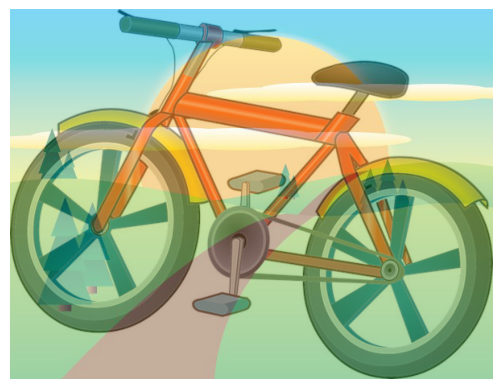

In [32]:
plt.imshow(img1 // 2 + img2 // 2)
plt.axis("off")
plt.show()

✏️ Describe why the two images are not same. (4 points)
The two combinations differ because of how integer division interacts with pixel addition; rounding errors, overflow effects, and the order of calculations (sum vs. average) cause the results to be similar but not always identical. For image blending, using a weighted average or float division ((img1.astype(float) + img2.astype(float))/2) is preferred for accuracy and smooth appearance.

In [33]:
# hint:
print(
    f"{img1.dtype=}, {img2.dtype=} {img1.max()=} {img2.max()=} {(img1 + img2).max()=}"
)

img1.dtype=dtype('uint8'), img2.dtype=dtype('uint8') img1.max()=np.uint8(255) img2.max()=np.uint8(255) (img1 + img2).max()=np.uint8(255)


## Weighted combination

Now let's write a function to combine two images using the specified portion of each image. The function should receive two images and a portion for each image.

$$
I = \alpha I_1 + (1 - \alpha) I_2,\quad \alpha \in [0, 1]
$$

We can consider each image as a point in the N-dimensional space ($N$ is the number of pixels in the image). Then the output of this function forms a line between the two points.

In [34]:
def combin_images(img1: np.ndarray, img2: np.ndarray, alpha: float) -> np.ndarray:
    """
    Combine two images by averaging the pixel values.

    Parameters
    ----------
    img1 : np.ndarray
        The first image.
    img2 : np.ndarray
        The second image.
    alpha : float
        The weight of the first image. (0 <= alpha <= 1)

    Returns
    -------
    np.ndarray
        The combined image.
    """
    if img1.shape != img2.shape:
        raise ValueError("The input images should have the same shape.")
    if not 0 <= alpha <= 1:
        raise ValueError("The alpha should be between 0 and 1.")
    # Weighted sum: img1*alpha + img2*(1-alpha)
    combined = img1 * alpha + img2 * (1 - alpha)
    # If image dtype is uint8, ensure pixel value limits
    if np.issubdtype(img1.dtype, np.integer):
        combined = np.clip(combined, 0, 255)
        combined = combined.astype(img1.dtype)
    return combined
    return np.zeros_like(img1)

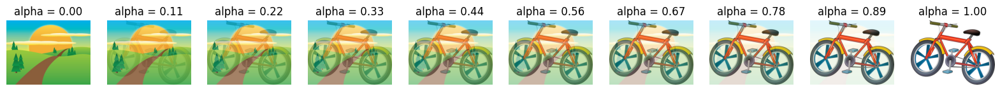

In [35]:
n = 10
plt.figure(figsize=(20, 10))
for i, alpha in enumerate(np.linspace(0, 1, 10), start=1):
    plt.subplot(1, n, i)
    plt.imshow(combin_images(img1, img2, alpha))
    plt.axis("off")
    plt.title(f"alpha = {alpha:.2f}")
plt.show()

## Let's do some visualization

In [37]:
# use the slider to see the animation :)
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams["figure.dpi"] = 150
plt.ioff()
fig, ax = plt.subplots()
n_frames = 30
x = np.linspace(0, 1, n_frames)


def animate(t):
    plt.cla()
    plt.imshow(combin_images(img1, img2, x[t]))
    plt.axis("off")


matplotlib.animation.FuncAnimation(fig, animate, frames=n_frames)

# Q4 - Curve Fitting

We have n data points $\mathcal{X}=\{(i, y_i)|\; i\in\{0, \dots, n-1\}\}$ and we want to make a polynomial curve like $y_i = \sum_{j=0}^{n-1} a_j i^j\quad \forall y_i \in \mathcal{X}$. So, we have $n$ equations with $n$ unknowns variables ($a_j$'s).

In highschool we always was doing same thing, we were finding the a quadratic curve that fits with 3 points. or before that we were finding a line that fits with 2 points.

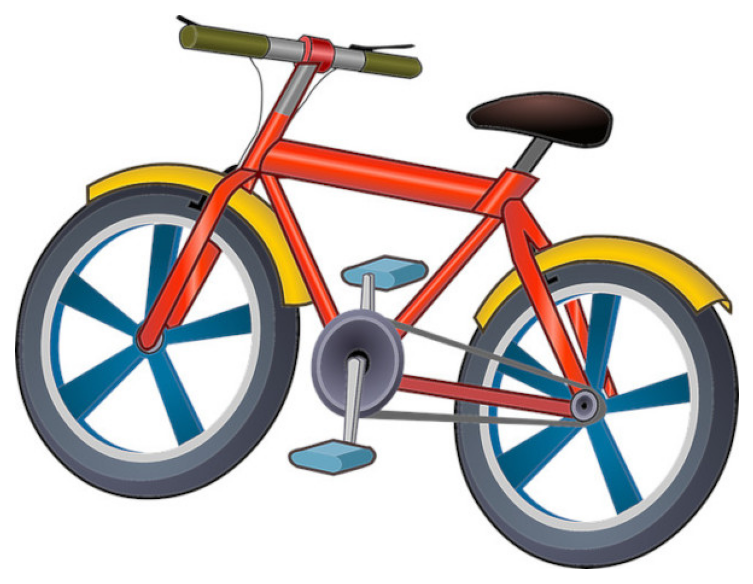

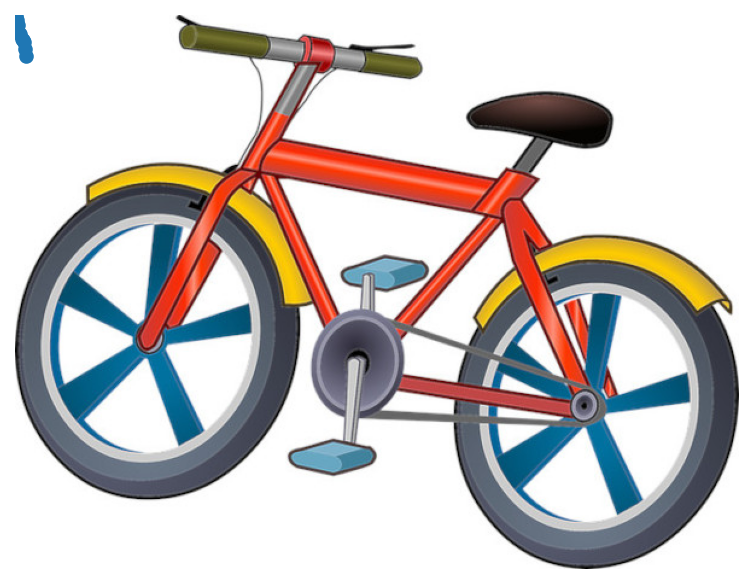

In [38]:
n = 10
x = np.arange(n)
y = np.array(
    [
        0.66124215,
        4.28117532,
        8.04712367,
        14.85568767,
        15.32010262,
        19.55498843,
        20.76250358,
        21.83181982,
        27.95509313,
        33.8009372,
    ]
)
plt.plot(x, y, "o")
plt.show()

## Finding different powers

In this part, we are going to find different powers data. For instance, if we have a matrix $X$ with $n$ points $X = [x_0, x_1, \dots, x_{n-1}]$, We want to find the matrix $\hat{X}$ like:

$$
\hat{X} = \begin{bmatrix}
1 & x_0 & x_0^2 & \dots & x_0^{n-1}\\
1 & x_1 & x_1^2 & \dots & x_1^{n-1}\\
\vdots & \vdots & \vdots & \ddots & \vdots\\
1 & x_{n-1} & x_{n-1}^2 & \dots & x_{n-1}^{n-1}
\end{bmatrix}
$$


In [39]:
def prepare_x(x: np.ndarray, degree: int) -> np.ndarray:
    """
    Prepare the x matrix for the polynomial regression.
    it will return a matrix with the shape (x.size, degree + 1)

    Parameters
    ----------
    x : np.ndarray
        The input x values.
    degree : int
        The degree of the polynomial.

    Returns
    -------
    np.ndarray
        The x matrix for the polynomial regression.
        [ x^0, x^1, x^2, ..., x^degree]
    """
    x = np.asarray(x).reshape(-1)  # Ensure 1D
    return np.vander(x, degree + 1, increasing=True)

In [40]:
assert np.all(
    prepare_x(np.array([1, 2, 3]), 3)
    == np.array([[1, 1, 1, 1], [1, 2, 4, 8], [1, 3, 9, 27]])
), "Test case 1 failed"

assert np.all(
    prepare_x(np.array([1, 2, 3]), 2) == np.array([[1, 1, 1], [1, 2, 4], [1, 3, 9]])
), "Test case 2 failed"

assert np.all(
    prepare_x(np.array([1, 2, 3]), 1) == np.array([[1, 1], [1, 2], [1, 3]])
), "Test case 3 failed"


This is the last function, In this function we are going to find the coefficients of the polynomial curve that fits with the data points.

As you remeber, we had $X$ and $\hat{X}$, now we can find the coefficients using the following formula:

$$
\mathbf{A} = \hat{X}^{-1} \mathbf{y}
$$

> Hint: Since, the matrix $\hat{X}$ is a [Vandermonde matrix](https://en.wikipedia.org/wiki/Vandermonde_matrix), it's invertible.

where $\mathbf{a}$ is the vector of the coefficients and $\mathbf{y}$ is the vector of the data points.

In [41]:
def find_cooeficients(x: np.ndarray, y: np.ndarray) -> np.ndarray:
    r"""
    Find the coefficients of the line that fits the data.
    This function will find the a vector $A = [a_0, a_1, \dots, a_{n-1}]$ such that $y = a_0 + a_1 x + a_2 x^2 + \dots + a_{n-1} x^{n-1}$

    Parameters
    ----------
    x : np.ndarray
        The x values.
    y : np.ndarray
        The y values.

    Returns
    -------
    np.ndarray
        The coefficients of the line. is a matrix with the shape (x.size, 1)
    """
    if x.ndim != 1 or y.ndim != 1:
        raise ValueError("The input arrays should be 1D.")
    if x.shape != y.shape:
        raise ValueError("The input arrays should have the same shape.")

    # Step 1: Build the Vandermonde matrix
    degree = x.size - 1
    X_aug = prepare_x(x, degree)

    assert X_aug.shape == (x.size, x.size), f"Expected shape ({x.size}, {x.size}), but got {X_aug.shape}"

    # Step 2: Solve for coefficients
    coefs = np.linalg.solve(X_aug, y)
    # or: coefs, *_ = np.linalg.lstsq(X_aug, y, rcond=None)  # for noisy/overconstrained problems

    return coefs

✏️ Why we used `r` before the docstring? (2 points)
We use r before a docstring to create a raw string. This tells Python to treat backslashes as literal characters rather than escape sequences.

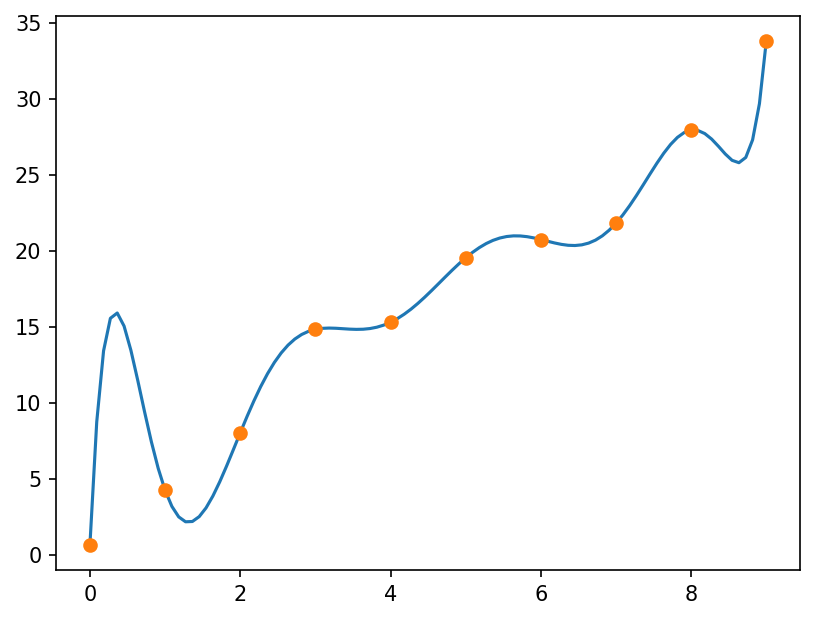

In [42]:
n = 10
x = np.arange(n)
y = np.array(
    [
        0.66124215,
        4.28117532,
        8.04712367,
        14.85568767,
        15.32010262,
        19.55498843,
        20.76250358,
        21.83181982,
        27.95509313,
        33.8009372,
    ]
)
assert np.allclose(y, prepare_x(x, n - 1) @ find_cooeficients(x, y).flatten()), "Test case 1 failed"
plt.plot(
    (xl := np.linspace(0, n - 1, 100)), (yl:=prepare_x(xl, n - 1) @ find_cooeficients(x, y))
)
plt.plot(x, y, "o")
plt.show()

# Q4.1 - Overfitting (Optional)
 
Let's consider fitted curve as our predcition for the given data. Now if we want to predict the value of $y_{n+1}$, we can use the fitted curve to predict it. But the fitted curve may not be a good predictor for $y_{n+1}$. for instance what if $x = 1.5$ or $x = 10$?

For this part complete the `predict` function that receives the coefficients of the fitted curve and the value of $x$ and returns the predicted value of $y$.

In [45]:
def predict(x: np.ndarray, coefs: np.ndarray) -> np.ndarray:
    """
    Predict the y values based on the x values and the coefficients.

    Parameters
    ----------
    x : np.ndarray
        new X values to predict the y values.
    coefs : np.ndarray
        The coefficients of the line.

    Returns
    -------
    np.ndarray
        The predicted y values.
    """
    if x.ndim != 1:
        raise ValueError("The input x should be 1D.")

    if coefs.ndim != 1 or coefs.size != np.squeeze(coefs).size:
        raise ValueError("The input coefs should be 1D.")
    
    # ✏️ What is the `np.squeeze` function? why it is useful here? (1 point)
    #np.squeeze(a) removes extra singleton dimensions (dimensions of size 1) from an array.

#Suppose the coefficients coefs come from a function that returns shape (n,1) or (n,). In that case, squeezing ensures they're a 1D array, which makes matrix multiplication and polynomial evaluation simpler and less error-prone.

    # ✏️ predict the y values (1 point)
    return np.zeros_like(x)
    return np.zeros_like(y)

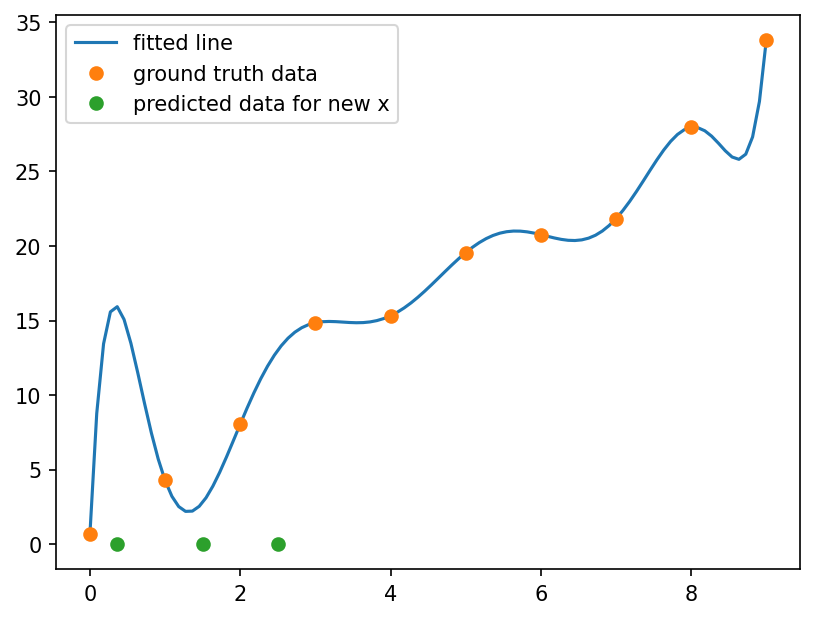

In [46]:
new_x = np.array([0.36, 1.5, 2.5])

plt.plot(xl, yl, label = "fitted line")
plt.plot(x, y, "o", label = "ground truth data")

plt.plot(new_x, predict(new_x, find_cooeficients(x, y)), "o", label = "predicted data for new x")

plt.legend()
plt.show()

As we can see, the predicted values for new points are not good. This is called overfitting. Overfitting is a common problem in machine learning. 



1. ✏️ find the some other values in some other point and report the ones that you fill does not make sense.
2. ✏️ what is the name of this phenomenon? and describe it.
3. ✏️ how can we avoid this phenomenon?
4. is our proposed method making good result for the following data?

```python
import numpy as np
import matplotlib.pyplot as plt

# Data
x = np.arange(10)
y = np.array([3.70433281, 9.90674031, 21.44636611, 42.65899337, 65.18236995, 
              99.13665246, 133.00386576, 177.61720716, 226.4799699, 281.53729801])

# Fit polynomial of degree 9 (perfect interpolation—risk of overfitting)
coefs = np.polyfit(x, y, deg=9)
poly = np.poly1d(coefs)

# Predict at points inside and outside the training range
test_x = np.array([0.5, 3.5, 7.7, 12, 15, 25])
y_pred = poly(test_x)


return test_x
return y_pred

```


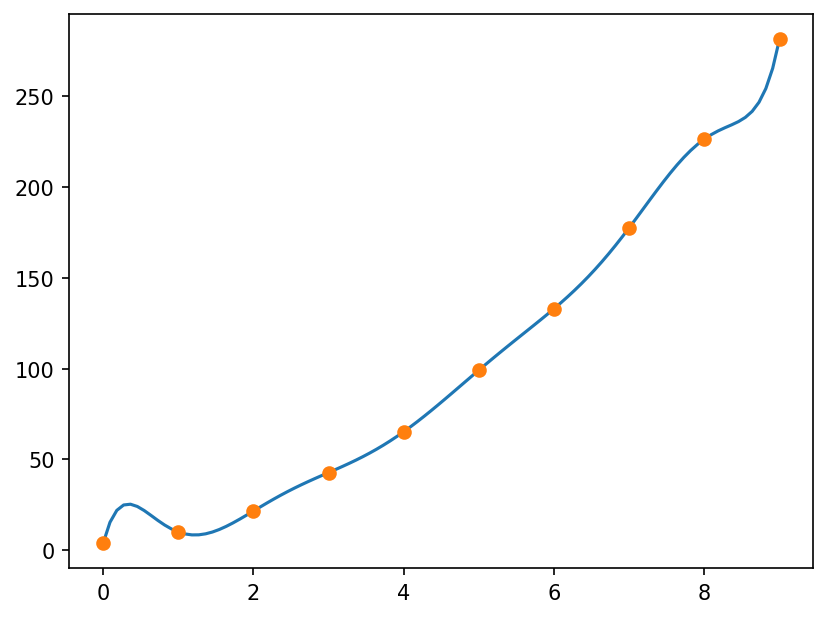

In [49]:
# We can see the previous method is somehow working good here.
n = 10
x = np.arange(0, n)
y = np.array(
    [
        3.70433281,
        9.90674031,
        21.44636611,
        42.65899337,
        65.18236995,
        99.13665246,
        133.00386576,
        177.61720716,
        226.4799699,
        281.53729801,
    ]
)

plt.plot(
    (xl := np.linspace(0, n - 1, 100)), prepare_x(xl, n - 1) @ find_cooeficients(x, y)
)
plt.plot(x, y, "o")
plt.show()


# Q5 - Random Walk

A random walk is a mathematical object, known as a stochastic or random process, that describes a path that consists of a succession of random steps on some mathematical space such as the integers. For instance, a random walk on the 2D plane, starts at the origin and at each step, it moves one unit in one of the four directions (up, down, left, right) with equal probability.

## Creating random steps

In the next function we are going to create random to create random path using the created steps.

So the function will receive the number of steps and the output be a random combination of (up, down, left, right) with equal probability.

> NOTE: since we are using cartesian coordinate system, the up is the positive y direction and the right is the positive x direction.

In [50]:
def create_steps(n: int) -> np.ndarray:
    """
    Create the steps array.
    The output should be an array with the shape (n, 2).
    The first column should be the steps in the x direction and the second column should be the steps in the y direction.
    The steps should be random values between -1 and 1.

    Parameters
    ----------
    n : int
        The number of steps.

    Returns
    -------
    np.ndarray
        The steps array.
    """
    # ✏️ create the steps array (2 points)
    directions = np.array([[1, 0], [-1, 0], [0, 1], [0, -1]])  # right, left, up, down
    idx = np.random.choice(4, size=n)  # choose direction indices randomly
    steps = directions[idx]
    return steps
    return np.zeros((n, 2))

In [51]:
# Test cell
assert create_steps(10).shape == (10, 2), "The shape of the output should be (n, 2)"
assert np.all(
    np.unique(create_steps(100)) == np.array([-1, 0, 1])
), "The steps should be random values contain -1, 0, 1 only"
assert (set((map(tuple, np.unique(create_steps(10), axis=0).tolist()))) == {(-1, 0), (0, -1), (0, 1), (1, 0)}
        ),"The steps should be randomly chosen from [-1,0] or [0,1] or [1,0] or [0,-1]"

## Converting the steps to the actual path

After defining the random steps, we want to find the loction of the walker after each step. 

In [52]:
def find_location(
    steps: np.ndarray, starting_point: tuple[int, int] = None
) -> np.ndarray:
    """
    Find the location of the steps.
    The output should be an array with the shape (n, 2).
    The first column should be the x location and the second column should be the y location.

    Parameters
    ----------
    steps : np.ndarray
        The steps array. check the output of the create_steps function.
    starting_point : tuple[int, int]
        The starting point of the steps. (default is [0, 0])

    Returns
    -------
    np.ndarray
        The location of the steps.
    """
    if starting_point is None:
        starting_point = (0, 0)

    if steps.ndim != 2 or steps.shape[1] != 2:
        raise ValueError("The input steps should be a 2D array with shape (n, 2).")

    # Cumulative sum of steps along axis 0 (rows): gives you all positions *relative* to origin
    locations = np.cumsum(steps, axis=0)

    # Add the starting point to all locations
    locations = locations + np.array(starting_point)

    return locations
    return np.zeros((steps.shape[0], 2))

In [53]:
# check a very simple case
steps = create_steps(5)
print(steps)
find_location(steps)

[[ 0 -1]
 [ 0  1]
 [ 0  1]
 [ 0 -1]
 [-1  0]]


array([[ 0, -1],
       [ 0,  0],
       [ 0,  1],
       [ 0,  0],
       [-1,  0]])

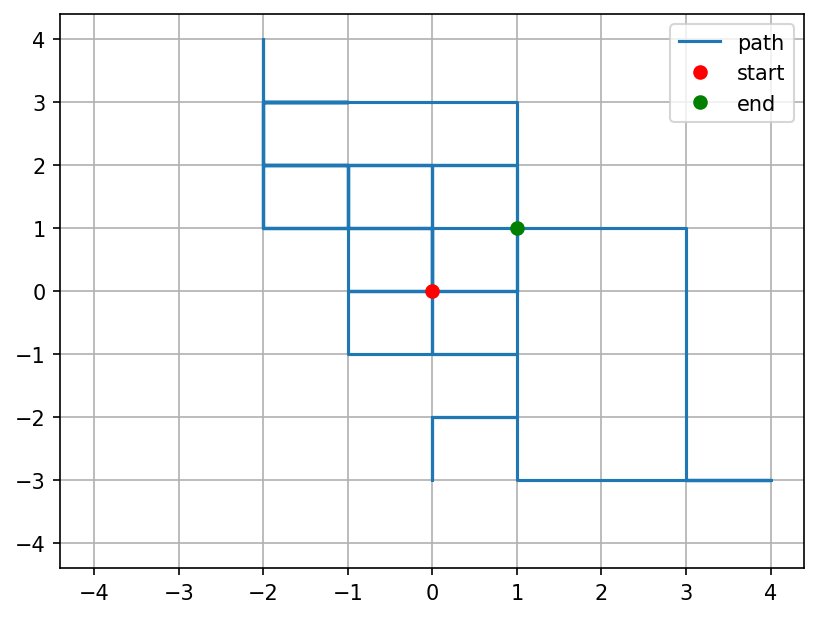

In [54]:
n = 100
starting_point = (0, 0)
steps = create_steps(n)
locations = find_location(steps, starting_point)
plt.plot(locations[:, 0], locations[:, 1])
plt.plot(starting_point[0], starting_point[1], "ro")
plt.plot(locations[-1, 0], locations[-1, 1], "go")
plt.legend(["path", "start", "end"])
plt.xlim(-(t := np.abs(locations[:, 0]).max()) * 1.1, t * 1.1)
# plt.xticks(np.arange(-t, t+1))
plt.ylim(-(t := np.abs(locations[:, 1]).max()) * 1.1, t * 1.1)
# plt.yticks(np.arange(-t, t+1))
plt.grid()
plt.show()

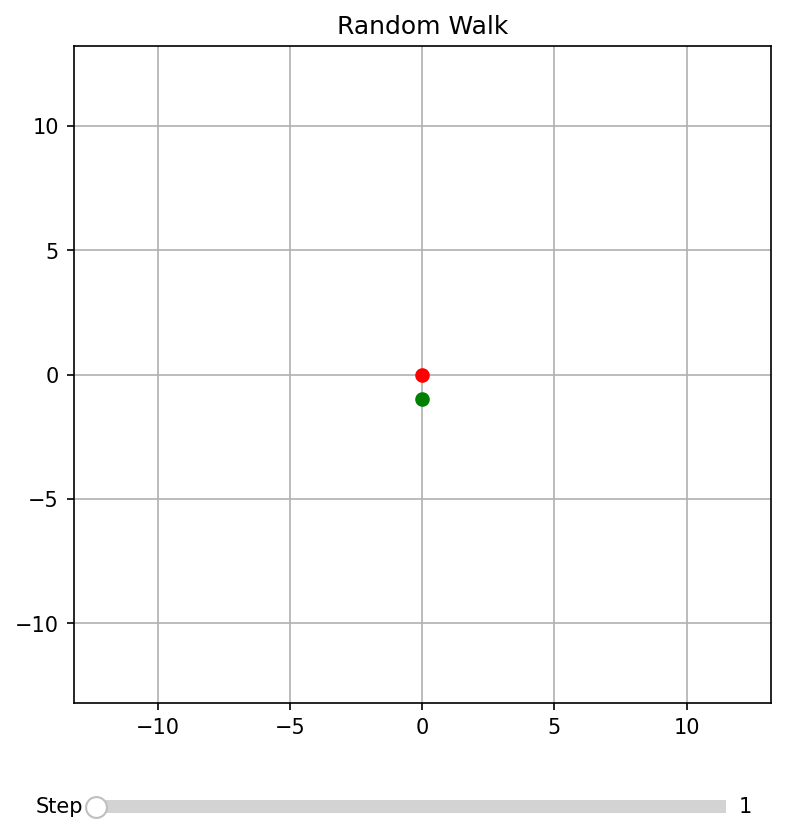

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider

# Assume create_steps and find_location are already defined as before
n = 500
starting_point = (0, 0)
steps = create_steps(n)
locations = find_location(steps, starting_point)

fig, ax = plt.subplots(figsize=(6, 6))
plt.subplots_adjust(bottom=0.15)

l_path, = ax.plot([], [], lw=2)
l_start, = ax.plot(starting_point[0], starting_point[1], "ro")
l_end, = ax.plot([], [], "go")

t_max = np.abs(locations).max() * 1.1
ax.set_xlim(-t_max, t_max)
ax.set_ylim(-t_max, t_max)
ax.grid()
ax.set_title("Random Walk")

ax_slider = plt.axes([0.15, 0.02, 0.7, 0.03], facecolor='lightgoldenrodyellow')
frame_slider = Slider(ax_slider, 'Step', 1, n-1, valinit=1, valfmt='%0.0f', valstep=1)

def update(val):
    t = int(frame_slider.val)
    l_path.set_data(locations[:t, 0], locations[:t, 1])
    l_end.set_data([locations[t-1, 0]], [locations[t-1, 1]])  # FIXED: use lists for markers
    fig.canvas.draw_idle()

frame_slider.on_changed(update)
update(frame_slider.val)  # initialize with current slider value

plt.show()


## Distance from the origin

Now let's do the experiment for several times:

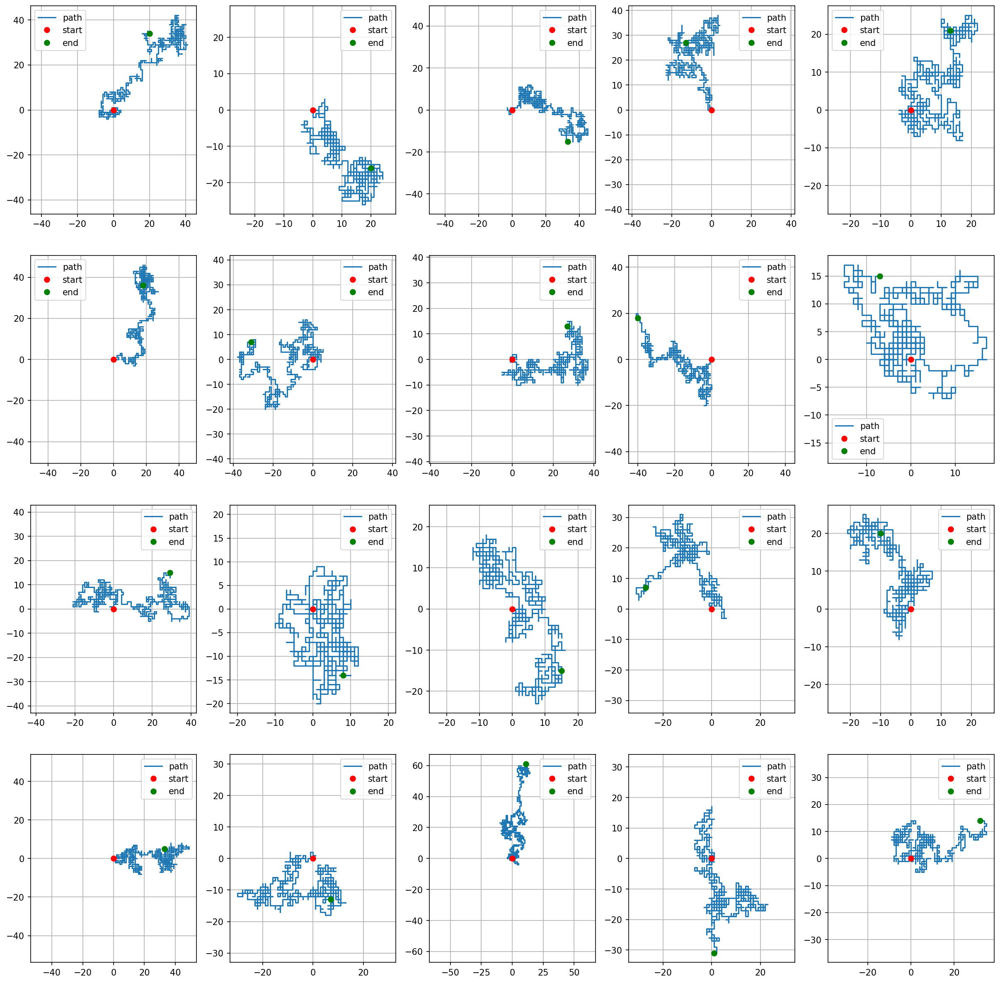

In [58]:
n = 1000
fig, axes = plt.subplots(4, 5, figsize=(20, 20))
starting_point = (0, 0)
for ax in axes.ravel():
    steps = create_steps(n)
    locations = find_location(steps, starting_point)
    ax.plot(locations[:, 0], locations[:, 1])
    ax.plot(starting_point[0], starting_point[1], "ro")
    ax.plot(locations[-1, 0], locations[-1, 1], "go")
    ax.legend(["path", "start", "end"])
    ax.set_xlim(
        -(t := max(np.abs(locations[:, 0]).max(), np.abs(locations[:, 1]).max()) * 1.1),
        t,
    )
    # plt.xticks(np.arange(-t, t+1))
    ax.set_ylim(-t, t)
    # plt.yticks(np.arange(-t, t+1))
    ax.grid()
plt.show()

![](walker-output.png)

In this part, we are interested in the distance of the walker from the origin after each step. We want to find the expected value of the distance from the origin after $n$ steps.

In [69]:
def find_distance(locations: np.ndarray, origin: tuple = (0, 0)) -> np.ndarray:
    """
    Find Euclidean distance from the origin for each location.
    """
    # locations shape: (number_of_steps, 2)
    diff = locations - np.array(origin)
    return np.linalg.norm(diff, axis=1)


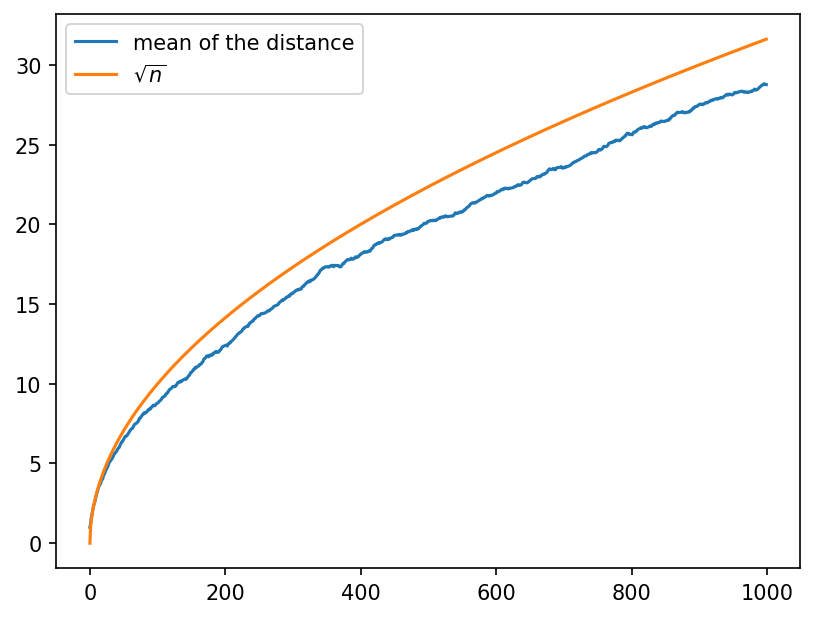

In [70]:
number_of_steps = 1000
number_of_experiment = 500
all_distances = []

for _ in range(number_of_experiment):
    steps = create_steps(number_of_steps)
    locations = find_location(steps)
    distances = find_distance(locations, (0, 0))  # Now works!
    all_distances.append(distances)

# Stack results as columns for shape (number_of_steps, number_of_experiment)
all_distances = np.stack(all_distances, axis=1)
mean = all_distances.mean(axis=1)
std = all_distances.std(axis=1)

x = np.arange(number_of_steps)
plt.plot(mean, label="mean of the distance")
plt.plot(x, x ** 0.5, label=r"$\sqrt{n}$")  # Use raw string for math
plt.legend()
plt.show()


Is there any relation between the distance from the origin and the number of steps?\
Accoring to the simulation, it sounds to be in order of $\sqrt{n}$, do you have any mathematical proof for this? (Search if you are curious, it's not important for this course)

## Number of visited points

Count number of unique points that the walker have visited.

In [71]:
def count_visited_points(locations: np.ndarray) -> np.ndarray:
    """
    Counts the number of visited locations in each step.

    Parameters
    ----------
    locations : np.ndarray
        The locations of the steps. check the output of the find_location function.

    Returns
    -------
    np.ndarray
        The number of visited locations in each step.

    """

    visited = set()
    counts = []
    for loc in map(tuple, locations):
        visited.add(loc)
        counts.append(len(visited))
    return np.array(counts)